In [1]:
%load_ext autoreload
%autoreload 2

import sys
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy.ndimage
import cv2
import time
import scipy.misc
import caffe
import seaborn as sns
from IPython import display
import time
from utils_dataRV import *

caffe_root = "./"
%matplotlib inline

size_image = (256, 216, 3)
sns.set_style("whitegrid", {'axes.grid' : False})

plt.rcParams['image.cmap'] = 'gray'

rep_dataset = "/home/atemmar/Documents/Stage_ets/caffe-release_segmentation/dataSet_preprocess/"


# Read training set

In [2]:
# rep_traininSet = "/home/luffy/Documents/Stage/dataSet_preprocess/Train/IRM/"
# rep_label = "/home/luffy/Documents/Stage/dataSet_preprocess/Train/Segment_GT/" 

rep_traininSet = rep_dataset + "/Train/IRM/"
rep_label = rep_dataset + "/Train/Segment_GT/" 

fileList = [f for f in list(os.walk(rep_traininSet))[0][2] if ".png" in f.lower()][:1000]

nb_image = 0
images_irm = np.zeros((size_image[0], size_image[1], size_image[2], len(fileList)))
labels = np.zeros((size_image[0], size_image[1], len(fileList)))
for filename in fileList:
    images_irm[:,:, :,nb_image] = scipy.misc.imread(rep_traininSet + filename)
    labels[:,:, nb_image] = scipy.misc.imread(rep_label + filename)
    nb_image += 1
            

# Read test set

In [3]:
rep_testSet = rep_dataset + "/Test/IRM/"
rep_label_test = rep_dataset + "/Test/Segment_GT/" 

fileList = [f for f in list(os.walk(rep_testSet))[0][2] if ".png" in f.lower()]

nb_image = 0
images_irm_test = np.zeros((size_image[0], size_image[1], size_image[2], len(fileList)))
labels_test = np.zeros((size_image[0], size_image[1], len(fileList)))

for filename in fileList:
    images_irm_test[:,:, :,nb_image] = scipy.misc.imread(rep_testSet + filename)
    labels_test[:,:, nb_image] = scipy.misc.imread(rep_label_test + filename)
    nb_image += 1
            

# Training fcn U-net

In [4]:
caffe.set_device(0)
caffe.set_mode_gpu()
solver_name = caffe_root + "models/U-net/solver_unet_softmax.prototxt"
solver = caffe.SGDSolver(solver_name)

# for each layer, show the output shape
for layer_name, blob in solver.net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

data	(1, 1, 256, 216)
label	(1, 1, 256, 216)
conv1a	(1, 32, 256, 216)
conv1b	(1, 32, 256, 216)
conv1co	(1, 32, 256, 216)
conv1co_conv1c_0_split_0	(1, 32, 256, 216)
conv1co_conv1c_0_split_1	(1, 32, 256, 216)
conv1c	(1, 32, 256, 216)
pool1	(1, 32, 128, 108)
conv2a	(1, 32, 128, 108)
conv2bo	(1, 32, 128, 108)
conv2bo_conv2b_0_split_0	(1, 32, 128, 108)
conv2bo_conv2b_0_split_1	(1, 32, 128, 108)
conv2b	(1, 32, 128, 108)
pool2	(1, 32, 64, 54)
conv3ao	(1, 32, 64, 54)
conv3ao_conv3a_0_split_0	(1, 32, 64, 54)
conv3ao_conv3a_0_split_1	(1, 32, 64, 54)
conv3a	(1, 32, 64, 54)
pool3	(1, 32, 32, 27)
deconv4	(1, 32, 64, 54)
deconv4ao	(1, 64, 64, 54)
deconv4r	(1, 64, 64, 54)
deconv5	(1, 32, 128, 108)
deconv5ao	(1, 64, 128, 108)
score	(1, 64, 128, 108)
deconv6	(1, 32, 256, 216)
deconv6ao	(1, 64, 256, 216)
deconv6r	(1, 64, 256, 216)
score-final	(1, 3, 256, 216)
loss	()


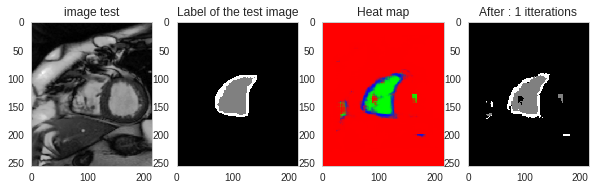

In [8]:
caffe.set_device(0)
caffe.set_mode_gpu()
solver_name = caffe_root + "models/U-net/solver_unet_softmax.prototxt"
solver = caffe.SGDSolver(solver_name)

nb_step = 170000

model_def_deploy = caffe_root + 'models/fcn_perso/fcn_perso7_deploy.prototxt'

# rep_model = "/media/luffy/DATA/Users/abdel/models_pretrained_rv_softmax/"
# rep_model = "/media/luffy/DATA/Users/abdel/models_pretrained_rv_softmax/perso1/"
rep_model  = "/home/atemmar/Documents/Stage_ets/caffe-release_segmentation/models_pretrained_rv/unet/"
model_weights = rep_model + 'train_perso7_Topo_pretrained_softmax_iter_200000.caffemodel'
# solver_softmax = rep_model + 'train_perso6_Topo_pretrained_augmented_softmax_iter_100000.solverstate'
solver_softmax = rep_model + 'train_unet_softmax_iter_' + str(nb_step) + '.solverstate'
solver.restore(solver_softmax)
# solver.net.copy_from(model_weights)

# solver.step(1)


do_training(solver=solver, step_size=1)
# image_test = solver.test_nets[0].blobs["data"].data[0,0,:,:]
# image_test_label = solver.test_nets[0].blobs["label"].data[0,0,:,:]
# plt.subplot(1,2,1)
# plt.imshow(image_test)
# plt.title("image test")
# plt.subplot(1,2,2)
# plt.imshow(image_test_label)
# plt.title("Label of the test image")

value_loss = []

In [7]:
solver.test_nets[0].blobs["score"].data[0,:,:,:].shape

(64, 128, 108)

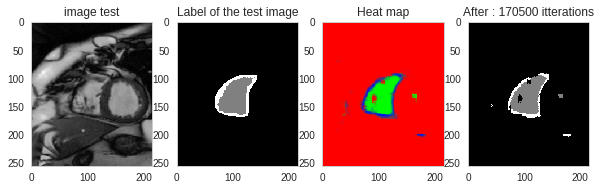

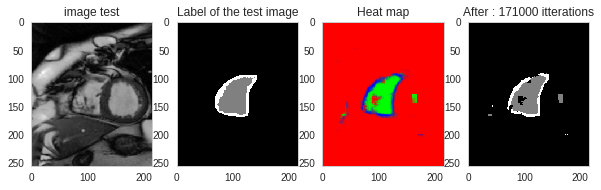

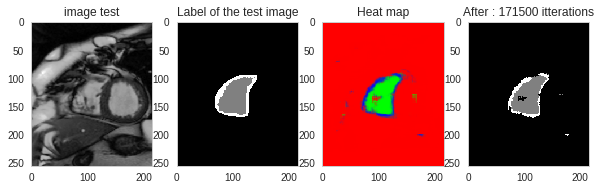

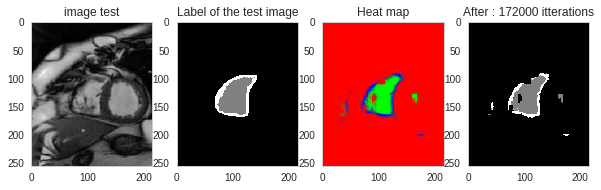

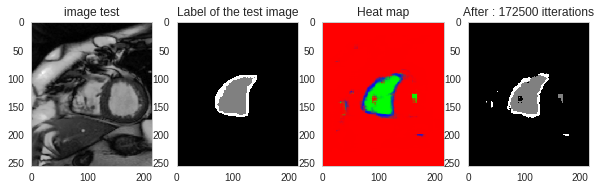

...

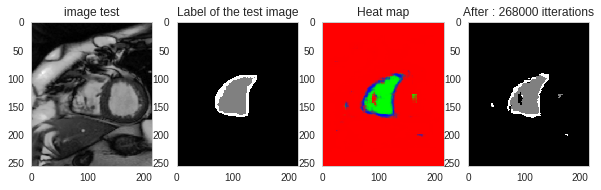

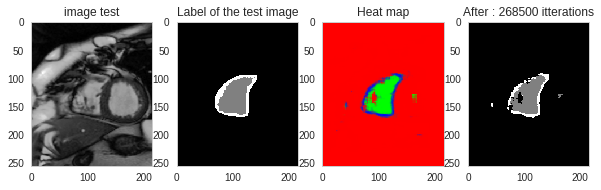

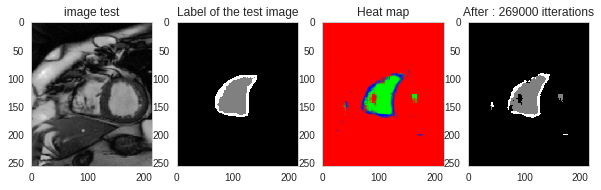

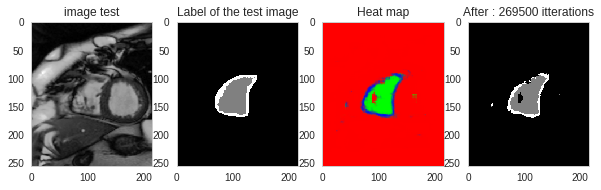

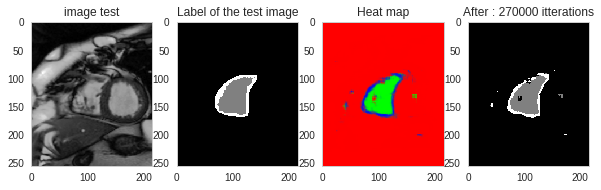

In [9]:
step_size = 500
for i in range(20*10):
    do_training(solver=solver, step_size=step_size, nb_step=nb_step)
    nb_step += step_size
#     value_loss.append(solver.test_nets[0].blobs["loss"].data)

# RESULTS

In [10]:
model_def_deploy = caffe_root + 'models/U-net/unet_deploy.prototxt'

model_weights = "/home/atemmar/Documents/Stage_ets/caffe-release_segmentation/models_pretrained_rv/unet/train_unet_softmax_iter_270000.caffemodel"

caffe.set_device(0)
caffe.set_mode_gpu()
net_deploy = caffe.Net(model_def_deploy,      # defines the structure of the model
                model_weights, caffe.TEST)


## Result on the training set

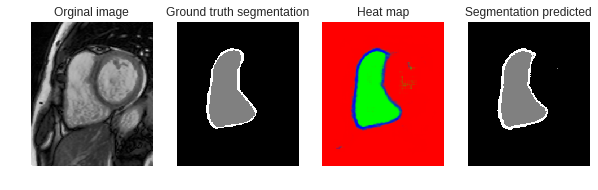

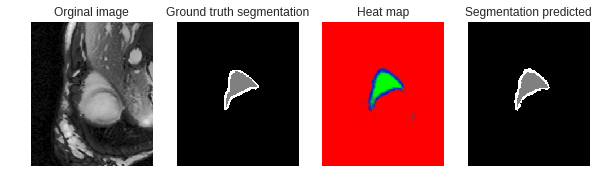

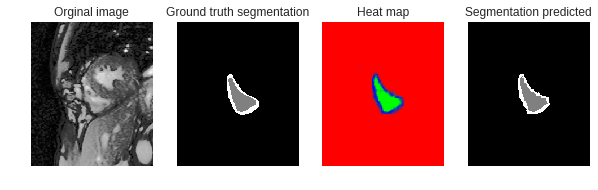

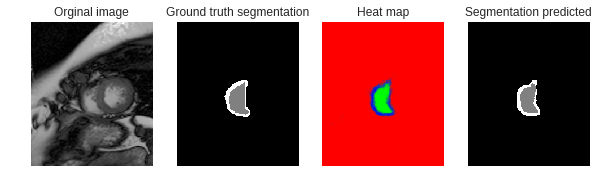

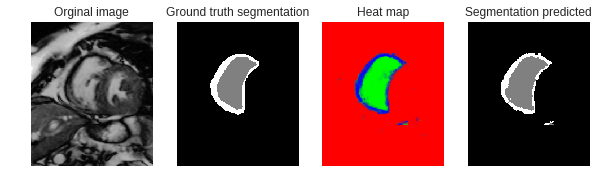

...

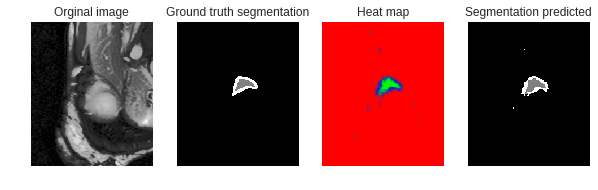

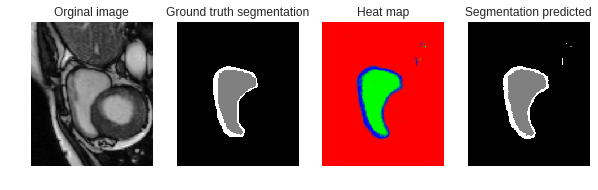

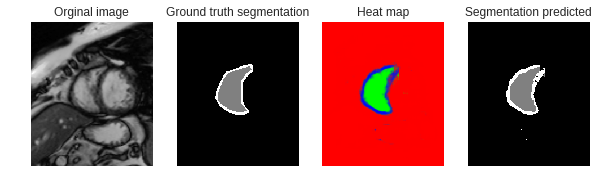

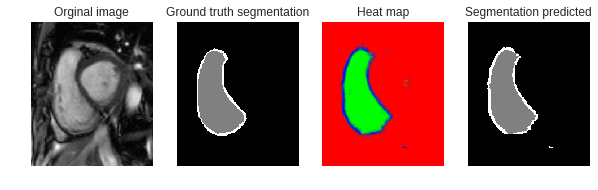

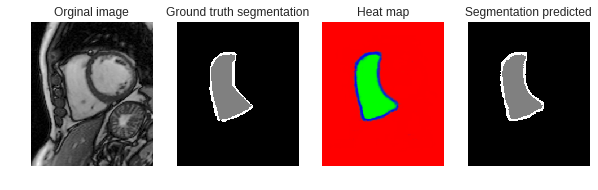

In [11]:

rep_save_results = caffe_root + "results/softmax/training/" 
display_results(dataset=images_irm, labels=labels, net_deploy=net_deploy, rep_save_results=None, nbImageToSave=100)

## Results on the test set

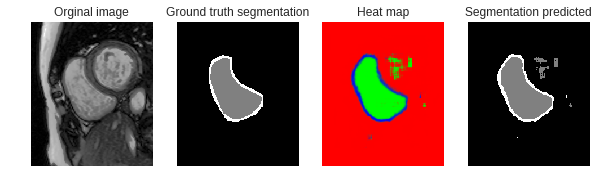

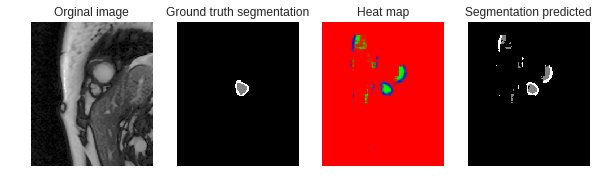

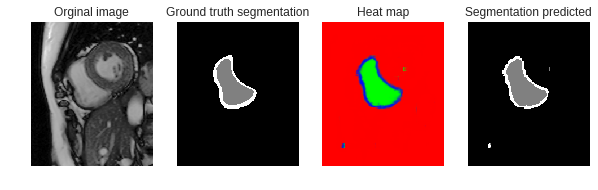

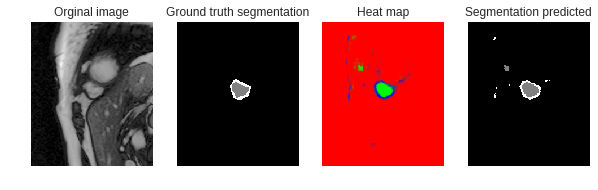

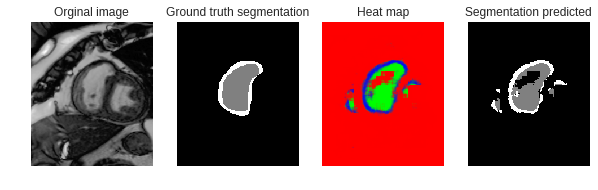

...

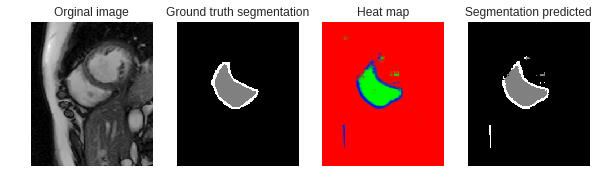

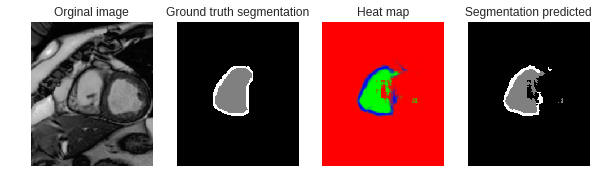

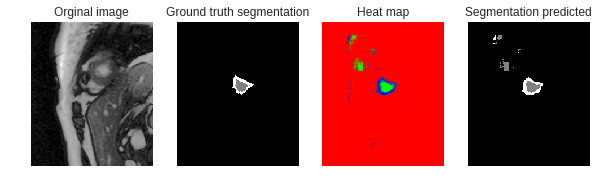

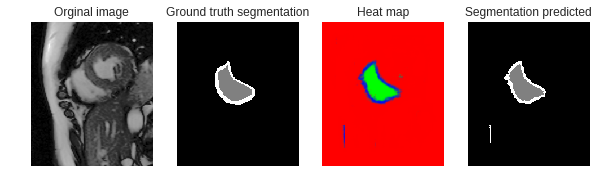

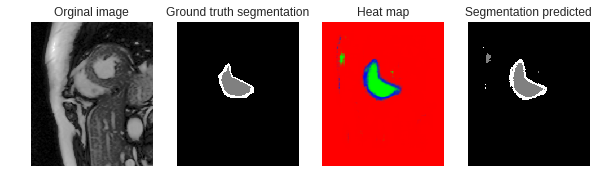

In [12]:

rep_save_results = caffe_root + "results/softmax/test/" 
display_results(dataset=images_irm_test, labels=labels_test, net_deploy=net_deploy, rep_save_results=rep_save_results)

In [ ]:
# the parameters are a list of [weights, biases]
net = solver.net
conv1 = net.blobs['score'].data

# plt.figure(figsize=(30,30))
plt.figure(figsize=(20,90))
nb_c = min(conv1.shape[1],10)
for i in range(conv1.shape[1]):
    plt.subplot(20,nb_c,i+1)
#     plt.figure(figsize=(10,10))
    plt.imshow(conv1[0,i,:,:], cmap='jet')
    plt.axis('off')



### Depending on the number of itterations done

#### Load all the nets

In [ ]:
nb_itterations = [2000, 20000, 100000, 180000, 250000, 300000, 340000, 480000, 580000]

model_def = caffe_root + 'models/fcn_perso/fcn_perso7_deploy.prototxt'
rep_model = "/home/atemmar/Documents/Stage_ets/caffe-release_segmentation/models_pretrained_rv/perso/"

nets = []

# solver_name = caffe_root + "models/fcn_perso/solver5_softmax.prototxt"
# solver = caffe.SGDSolver(solver_name)

caffe.set_device(0)
caffe.set_mode_gpu()
for nb_itter in nb_itterations:
    model_weights = rep_model + 'train_perso7_Topo_pretrained_softmax_iter_' + str(nb_itter) +'.caffemodel'
#     solver.restore(model_solver)
#     net = solver.net
    net = caffe.Net(model_def,      # defines the structure of the model
                model_weights, caffe.TEST)     # use test mode (e.g., don't perform dropout)
    nets.append(net)

In [ ]:
nbs_nets = len(nets)
nb_columns_display = 2 + nbs_nets

for num_image_test in range(images_irm_test.shape[3]):
    img = images_irm_test[:,:,0,num_image_test]
    
    max_img, min_img = np.max(img), np.min(img)
    img = 2*(img-max_img)/(max_img - min_img) - 1
    
    label = labels_test[:,:, num_image_test]

    plt.figure(figsize=(30,30))
    plt.subplot(1,nb_columns_display,1)
    plt.imshow(img)
    plt.title("Orginial image")
    plt.subplot(1,nb_columns_display,2)
    plt.imshow(label, vmin=0, vmax=2)
    plt.title("Ground truth segmentation")
    for i, net in enumerate(nets):
        net.blobs['data'].data[...] = img
        net.forward()
        out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
        label_out = out.argmax(axis=2)
        plt.subplot(1,nb_columns_display,2+i+1)
        plt.imshow(normalize_heatmap(out))
        plt.title("Segmentation predicted after " + str (nb_itterations[i]))

#### Object dice coefficient depending on the number of itterations done (test set)

In [ ]:
accuaracy_depending_nbItterations = np.zeros(len(nets), dtype=np.float)

for num_image_test in range(images_irm_test.shape[3]):
    img = images_irm_test[:,:,:,num_image_test]
    img = preprocessing_test(img)
    label = labels_test[:,:, num_image_test]
    for i, net in enumerate(nets):
        net.blobs['data'].data[...] = img
        net.forward()
        out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
        label_predicted = out.argmax(axis=2)
#         accuaracy_depending_nbItterations[i] += np.sum((label == label_predicted).astype(int))/float(label.size)
        accuaracy_depending_nbItterations[i] += dice_metric(label_predicted, label)
    
accuaracy_depending_nbItterations /= images_irm_test.shape[3]
        

In [ ]:
plt.plot(nb_itterations, accuaracy_depending_nbItterations)
plt.title("Dice coefficient depending on the number of itterations done (test set)")

#### Object dice coefficient depending on the number of itterations done (training set)

In [ ]:
accuaracy_depending_nbItterations_train = np.zeros(len(nets), dtype=np.float)

indicies = range(images_irm.shape[3])
np.random.shuffle(indicies)
indicies = indicies[:100]

for num_image_test in indicies:
    img = images_irm[:,:,:,num_image_test]
    img = preprocessing_test(img)
    label = labels[:,:, num_image_test]
    for i, net in enumerate(nets):
        net.blobs['data'].data[...] = img
        net.forward()
        out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
        label_predicted = out.argmax(axis=2)
#         accuaracy_depending_nbItterations[i] += np.sum((label == label_predicted).astype(int))/float(label.size)
        accuaracy_depending_nbItterations_train[i] += dice_metric(label_predicted, label)
    
accuaracy_depending_nbItterations_train /= len(indicies)

In [ ]:
plt.plot(nb_itterations, accuaracy_depending_nbItterations_train)
plt.title("Dice coefficient depending on the number of itterations done (training set)")

In [ ]:
2